In [111]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import IPython.display as ipd
import fma.utils
import keras.backend as K
from keras.models import load_model


In [371]:
from utils.load_transform_data import get_tracks_locations, create_windows_from_spectrogram
from utils.evaluation import get_full_song_predictions


In [372]:
from load_small_dataset import tracks, train_valid_tracks, x_train_ids,\
    validation_valid_tracks, x_val_ids, test_valid_tracks, x_test_ids

Read 8000 files


/Users/diegoaguado/Desktop/Music_Project/Music-Classification/fma/utils.py:213: FutureWarning: specifying 'categories' or 'ordered' in .astype() is deprecated; pass a CategoricalDtype instead
  'category', categories=SUBSETS, ordered=True)


# How to use this notebook.
The following notebook computes activation layers for different tracks and plots them.

## Parameters
To use the following notebook, select the parameters to build the spectrograms with the corresponding shape while training your model and change the model path to load it.

In [82]:
windows_number = 10
hop_length = 350


In [6]:
model_path = 'saved_models/hop_length_350.h5'


In [10]:
my_model = load_model(model_path)


In [81]:
tracks = fma.utils.load('fma/tracks.csv')
tracks.head(3)


/Users/diegoaguado/Desktop/Music_Project/Music-Classification/fma/utils.py:213: FutureWarning: specifying 'categories' or 'ordered' in .astype() is deprecated; pass a CategoricalDtype instead
  'category', categories=SUBSETS, ordered=True)


In [13]:
track_locations = get_tracks_locations()


Read 8000 files


In [86]:
def load_song_by_id(track_id):
    track_location = [x for x in track_locations if int(track_id) == int(x.split ('/')[-1][:6])]
    if not track_location:
        print("Track with track id {} not small data set".format(track_id))
        raise ValueError
    track_location = track_location[0]
    x, sr = librosa.load(track_location, sr=None, mono=True)
    mel = np.transpose(librosa.feature.melspectrogram(y=x, sr=sr, hop_length=hop_length))
    return x, sr, {0:librosa.logamplitude(mel)}


## Hip - Hop

In [403]:
track_id = 2
signal_hiphop, sr_hiphop, full_spectrogram_hiphop = load_song_by_id(track_id)
print(tracks.loc[track_id][('track', 'genre_top')])
ipd.Audio(data=signal, rate=sr)


Hip-Hop


In [404]:
windowed_track_hiphop = create_windows_from_spectrogram(full_spectrogram_hiphop, nb_windows=windows_number)


In [405]:
prediction_probabilities = my_model.predict(windowed_track_hiphop)
averaged_predictions = prediction_probabilities.mean(axis=0)
averaged_predictions


array([  6.12884574e-03,   9.91476238e-01,   1.55219412e-03,
         8.42736859e-04], dtype=float32)

The above probabilities means it actually predicted 'Hip-Hop' with 99% accuracy

### Computing Layers activations
To compute and visualize the activations of the model's layers we have the following two methods:
```python
compute_activation_layer()
visualize_spectrogram_first_layer()
```


In [318]:
inp = my_model.input                                           
outputs = [layer.output for layer in my_model.layers]          
functors = [K.function([inp]+ [K.learning_phase()], [out]) for out in outputs]

def compute_activation_layer(spectrograms_windows, example_number, layer_num=1):
    example = spectrograms_windows[example_number,:,:].reshape((1, 377, 128))
    layer_outs = [func([example, 1.]) for func in functors]
    layer_activation = layer_outs[layer_num][0]
    activation_shape = layer_activation.shape
    layer_activation = layer_activation.reshape((layer_activation.shape[1],layer_activation.shape[2]))
    
    return np.transpose(layer_activation)


In [311]:
def visualize_spectrogram_first_layer(track_windows, example_number=0):
    fig = plt.figure(figsize=(10,10))
    plt.subplot(211)
    plt.imshow(compute_activation_layer(track_windows,example_number,0))
    plt.subplot(212)
    plt.imshow(compute_activation_layer(track_windows,example_number,1))
    plt.show()


## Visualization of spectrogram and first convolutional layer

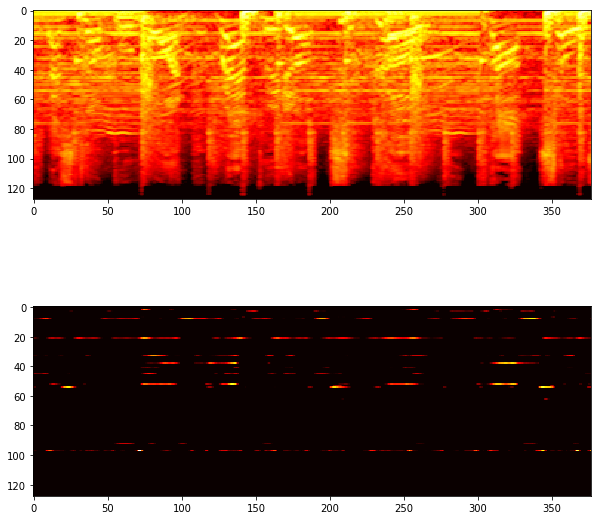

In [462]:
visualize_spectrogram_first_layer(windowed_track_hiphop, 6)

## Rock

In [433]:
track_id = 574
signal_rock, sr_rock, full_spectrogram_rock = load_song_by_id(track_id)
print(tracks.loc[track_id][('track', 'genre_top')])
ipd.Audio(data=signal_rock, rate=sr)

Rock


In [435]:
windowed_track_rock = create_windows_from_spectrogram(full_spectrogram_rock, nb_windows=windows_number)
prediction_probabilities = my_model.predict(windowed_track_rock)
averaged_predictions = prediction_probabilities.mean(axis=0)
averaged_predictions

array([ 0.00400223,  0.00486506,  0.00139578,  0.98973691], dtype=float32)

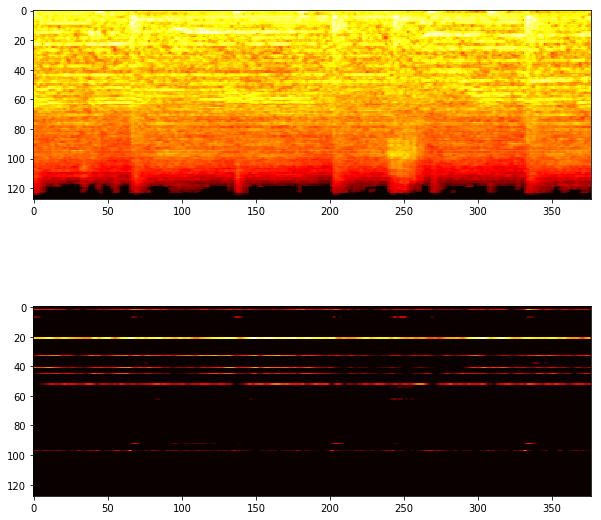

In [439]:
visualize_spectrogram_first_layer(windowed_track_rock, 3)

## Instrumental 

In [491]:
track_id = 152570 #152480
signal_instrumental, sr_instrumental, full_spectrogram_instrumental = load_song_by_id(track_id)
print(tracks.loc[track_id][('track', 'genre_top')])
ipd.Audio(data=signal_instrumental, rate=sr)


Instrumental


In [492]:
windowed_track_instrumental = create_windows_from_spectrogram(full_spectrogram_instrumental, window_size=377, nb_windows=windows_number)
prediction_probabilities = my_model.predict(windowed_track_instrumental)
averaged_predictions = prediction_probabilities.mean(axis=0)
averaged_predictions

array([ 0.10895135,  0.01502696,  0.73387134,  0.14215034], dtype=float32)

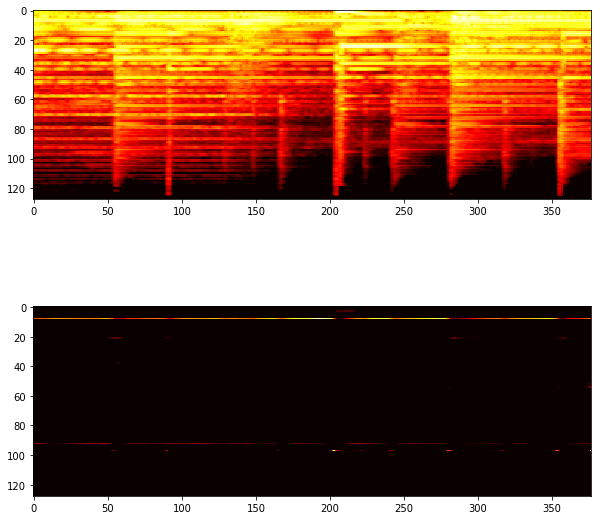

In [456]:
visualize_spectrogram_first_layer(windowed_track_instrumental, 7)

## Electronic 

In [487]:
track_id = 145462#4522
signal_electronic, sr_electronic, full_spectrogram_electronic = load_song_by_id(track_id)
print(tracks.loc[track_id][('track', 'genre_top')])
ipd.Audio(data=signal_electronic, rate=sr)


Electronic


In [488]:
windowed_track_electronic = create_windows_from_spectrogram(full_spectrogram_electronic, window_size=377, nb_windows=windows_number)
prediction_probabilities = my_model.predict(windowed_track_electronic)
averaged_predictions = prediction_probabilities.mean(axis=0)
averaged_predictions

array([ 0.70767725,  0.12585559,  0.11585142,  0.05061572], dtype=float32)

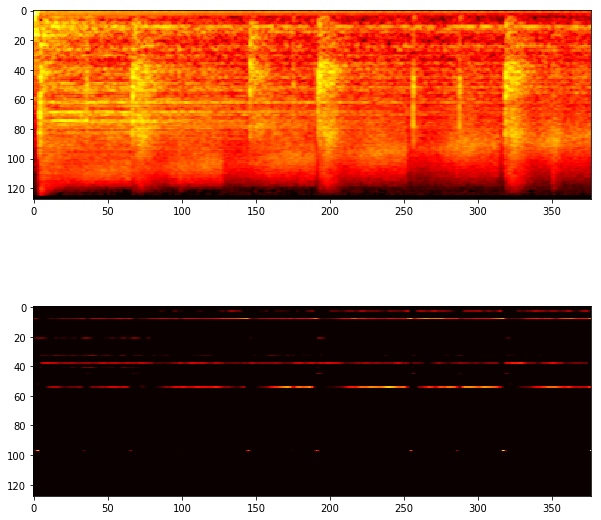

In [489]:
visualize_spectrogram_first_layer(windowed_track_electronic, 7)

In [ ]:
def compare_first_layer(track_1, track_2, window_number=0):
    fig = plt.figure(figsize=(12,12))
    plt.set_cmap(plt.get_cmap('hot'))
    plt.subplot(121)
    plt.imshow(compute_activation_layer(track_1,window_number,1))
    plt.subplot(122)
    plt.imshow(compute_activation_layer(track_2,window_number,1))
    plt.show()

## Hip - Hop vs Rock

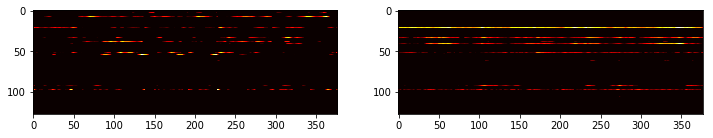

In [457]:
compare_first_layer(windowed_track_hiphop, windowed_track_rock, 8)

## Hip - Hop vs Instrumental

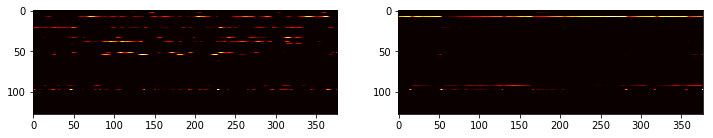

In [460]:
compare_first_layer(windowed_track_hiphop, windowed_track_instrumental, 8)

## Rock vs Instrumental

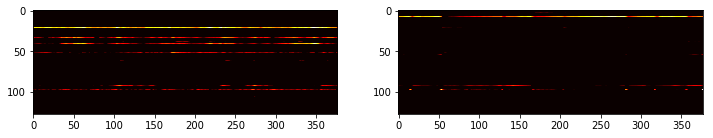

In [461]:
compare_first_layer(windowed_track_rock, windowed_track_instrumental, 8)

## Rock vs Electronic

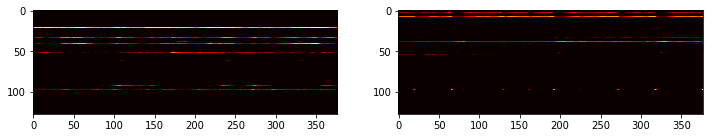

In [493]:
compare_first_layer(windowed_track_rock, windowed_track_electronic, 8)

## Hip - Hop vs Electronic

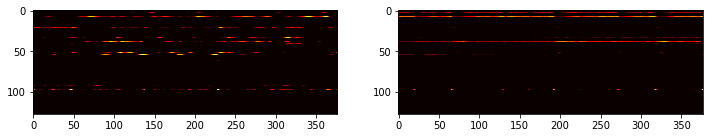

In [494]:
compare_first_layer(windowed_track_hiphop, windowed_track_electronic, 8)

## Instrumental vs Electronic

In [478]:
tracks.loc[[x[1] for x in train_valid_tracks]][tracks[('track', 'genre_top')]=='Electronic']

/Users/diegoaguado/anaconda2/envs/music/lib/python3.6/site-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


album                                                            \
         comments        date_created date_released      engineer favorites   
track_id                                                                      
1482            0 2008-11-26 02:58:24    2009-01-16           NaN         0   
3573            0 2008-12-04 09:27:42    2003-07-23   Jason Engel         2   
4519            0 2008-12-04 09:28:10    2008-10-28   Trent Wolbe         3   
4520            0 2008-12-04 09:28:10    2008-10-28   Trent Wolbe         3   
4521            0 2008-12-04 09:28:10    2008-10-28   Trent Wolbe         3   
4522            0 2008-12-04 09:28:10    2008-10-28   Trent Wolbe         3   
11206           1 2009-04-21 12:08:44    2009-03-02           NaN         1   
11262           2 2009-04-22 11:20:27    2004-11-12           NaN        24   
11942           0 2009-05-01 06:30:39    2009-05-01           NaN         1   
12189           0 2009-05-05 07:14:32    2008-10-01           NaN         1   
13562           0 2009-05-22 06:15:00    2007-04-01           NaN         1   
13571           0 2009-05-22 06:15:00    2007-04-01           NaN         1   
13668           0 2009-05-22 17:17:51    2007-01-01           NaN         3   
14063           0 2009-05-28 10:57:05    2009-03-01           NaN         2   
14208           0 2009-06-01 16:13:05           NaT           NaN         2   
14344           0 2009-06-03 09:51:30    2009-05-01           NaN         1   
17588           0 2008-12-04 09:25:36    2008-08-20   Trent Wolbe         0   
17884           1 2009-08-10 08:29:54    2007-11-08           NaN         8   
21085           1 2009-11-16 12:53:26    2009-10-29           NaN         4   
21167           1 2009-11-18 13:22:37    2008-07-01           NaN         0   
21422           2 2009-11-28 17:44:56    2008-05-18           NaN         2   
21842           0 2009-12-04 10:31:35    2009-08-02           NaN         9   
21891           0 2009-12-06 14:19:11    2009-10-30           NaN         1   
21895           0 2009-12-06 14:19:11    2009-10-30           NaN         1   
22095           0 2009-12-12 13:27:16    2009-11-25           NaN         3   
23013           0 2010-01-04 21:17:52           NaT           NaN         4   
23016           1 2010-01-04 21:45:38           NaT           NaN         2   
23353           0 2010-01-11 21:16:07    2009-02-11           NaN         1   
23372           0 2010-01-11 23:07:41           NaT           NaN         0   
23505           0 2010-01-13 09:23:31    2007-06-10           NaN         1   
...           ...                 ...           ...           ...       ...   
145041          0 2016-10-14 03:35:28    2016-10-13           NaN         0   
145042          0 2016-10-14 03:35:28    2016-10-13           NaN         0   
145462          0 2016-10-27 20:56:05           NaT  Pennfodralet         0   
145464          0 2016-10-27 20:56:05           NaT  Pennfodralet         0   
145645          0 2016-11-01 15:05:41    2016-11-01           NaN         0   
145646          0 2016-11-01 15:05:41    2016-11-01           NaN         0   
145752          1 2016-11-02 10:36:12           NaT           NaN         2   
145754          1 2016-11-02 10:36:12           NaT           NaN         2   
145755          1 2016-11-02 10:36:12           NaT           NaN         2   
145756          1 2016-11-02 10:36:12           NaT           NaN         2   
145757          1 2016-11-02 10:36:12           NaT           NaN         2   
145758          1 2016-11-02 10:36:12           NaT           NaN         2   
145759          1 2016-11-02 10:36:12           NaT           NaN         2   
145760          1 2016-11-02 10:36:12           NaT           NaN         2   
145761          1 2016-11-02 10:36:12           NaT           NaN         2   
145917          0 2016-11-06 08:39:37           NaT  Pennfodralet         0   
145918          0 2016-11-06 08:39:37           NaT  Pennfodra